# Curitiba Self Driving Car #

## Project: **Finding Lane Lines on the Road** ##

### Author: Angelo Antonio Manzatto ###  

***

On this project I will apply the knowledge learned on **Udacity's** course of **Self Driving Cars** on the city of **Curitiba**, Brazil as I see a great opportunity here for a Smart City on a near future. 

One important step when deploying a full pipeline for automatic drive is to detect lane lines on the road. This can be seem as a trivial task on a well cared highway but impose a serious challenge when that is not the case.

All the footage for this project were taken on Avenida da Torres, famous for being the path for the airport, a great candidate for self driving cabs.

Our framework for lane detection will consist in the following steps:
* Camera
* Binay Map
* Lane Search
* Curvature
* Plot

### Libraries 

This project will be mainly conducted using the OpenCV library

In [35]:
import os
import numpy as np
import cv2
import glob

import matplotlib.pyplot as plt

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import display,HTML

%matplotlib inline

### Files and Folders

We will define some folders were the frames for processing and videos will be stored

In [2]:
camera_cal_folder = 'camera_cal'  # This folder is where we store the chess image for camera calibration
test_images_folder = 'test_images' # Generated test images are store here
video_folder = 'videos' # On this folder we store the videos that we will use to process and that are processed

airport_video_1 = 'videos/20190212_181549.mp4'
udacity_video_1 = 'videos/project_video.mp4'

## Videos

Let's take a look at the video we will be using for this project as well as the video used in the Udacity's course to see the difference between both.

In [3]:
HTML("""
<video width="460" height="320" controls muted>
  <source src="{0}">
</video>
<video width="460" height="320" controls>
  <source src="{1}">
</video>
""".format(airport_video_1,udacity_video_1))

While I believe that the Udacity's video (right one) was shot using a proper stereo camera mine (left one) was shot using my **Samsung Galaxy S6** on HD mode (1280 x 720).

Watching carefully both videos we can see the following differences:

| Angelo                                                           | Udacity                                             |
|:----------------------------------------------------------------:|:---------------------------------------------------:|
| Busy scene with lots of cars, light poles, clouds and buildings. | Calm scene with almost no car and clean sky.        |
| Some camera shake.                                               | Very little camera shake.                           |
| Good quality lanes                                               | Excelent quality lanes                              |

Now we will generate some testing frames with fixed time intervals so we can see how our lane detection process will perform.

In [4]:
def generate_test_images(video, n_samples = 20):
    """
    Generates sample images from a video file. All the images will be stored on the test_images_folder and .jpg files.
    
    Arguments:
        video - A video clip
        n_samples - Number of samples that will be generated on equally separated intervals.
        
    """
    
    # Define time interval to collect clip frames
    start = 1
    end = int(video.duration) - 5
    time_intervals = np.linspace(start, end, n_samples).astype('int')
    
    # Save frames into test folder
    for time in time_intervals:
        video.save_frame(os.path.join(test_images_folder,"test_frame_" + str(time) + ".jpg"), t=time)

In [5]:
# Load clip
clip = VideoFileClip(airport_video_1)
clip.reader.close()

In [6]:
generate_test_images(clip)

In [7]:
test_images = glob.glob(os.path.join(test_images_folder,'test*.jpg')) # Make a list of test images

## Camera

This class will be the entry point for process all video frames on our pipeline. There are two **very important** tasks that should be performed prior to execute the full framework that are **camera calibration** and define the source and destination points for the camera transformation matrix.

The `calibrate` function should be the first method called after class creation in order for the entire class to work properly since we need to eliminate distortions caused by the camera lens. Here we pass a series of chessboard pictures taken using our camera in order to find the transformation points for minimizing distortion. I just printed this [chessboard](https://www.mrpt.org/downloads/camera-calibration-checker-board_9x7.pdf)pdf file on a A4 paper and took 20 shots.

In [8]:
class Camera():
    
    def __init__(self, sizes=(1280,720)):
        
        # Arrays to store object points and image points from all the images.
        self.objpoints_ = [] # 3d points in real world space
        self.imgpoints_ = [] # 2d points in image plane.
        self.nx_ = 0 # Number of corners in X axis for the chess board for calibration
        self.ny_ = 0 # Number of corners in Y axis for the chess board for calibration
        self.mtx_ = None # Camera Matrix
        self.dist_  = None # Distortion coeficients
        self.rvecs_ = None # Rotation Vector
        self.tvecs_ = None # Translation Vector
        self.is_calibrated_ = False
        
        self.sizes_ = sizes  # Default image width, height

        # Default source point mapping for warping
        self.src_ = np.float32([(self.sizes_[0] * 0.10, self.sizes_[1]),         # bottom_left
                                (self.sizes_[0] * 0.40 ,self.sizes_[1] * 0.50),  # top_left
                                (self.sizes_[0] * 0.60, self.sizes_[1] * 0.50),  # top_right
                                (self.sizes_[0] * 0.90, self.sizes_[1])])        # bottom_right
                                                            
        
        # Destination point mapping for warping
        self.dst_ = np.float32([(self.sizes_[0] * 0.25, 0),              # bottom_left
                                (self.sizes_[0] * 0.25, self.sizes_[1]), # top_left
                                (self.sizes_[0] * 0.75, self.sizes_[1]), # top_right
                                (self.sizes_[0] * 0.75, 0)])             # bottom_right

        # Transformation matrices
        self.calculate_transformation_matrix(self.src_, self.dst_)
        
    def calibrate(self, chess_images, nx, ny, min_images_detected = 5, debug=True):
        '''
        Calibrate camera using a list of file paths for chess board images. This method should be the first to be invoked in
        order for this entire class to work properly
        
        Arguments:
            chess_images - List of paths for the chess images
            
            nx - Number of corners to be found on x axis.
            
            ny - Number of corners to be found on y axis.
            
            min_images_detected - Minimum number of files on where the corners should be detected to consider the calibration
            a success. Remember that the number of files to be used on this process should be equal or hight than the value here.
            
            debug - If true display each corner detection.
        '''
        
        # Check for the minimun number of images to use in camera calibratrion
        assert(len(chess_images)) >= min_images_detected
        
        self.nx_ = nx
        self.ny_ = ny
        
        images_detected = 0
        
        self.is_calibrated_ = False
        
        # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
        objp = np.zeros((self.nx_*self.ny_,3), np.float32) 
        objp[:,:2] = np.mgrid[0:self.nx_,0:self.ny_].T.reshape(-1,2)
        
        for image in chess_images:
            
            #Load image
            img = plt.imread(image)
            
            # Convert to grayscale
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  
            # Find the chessboard corners
            ret, corners = cv2.findChessboardCorners(gray, (self.nx_, self.ny_),None)

            # For all corners found map into points 
            if ret == True:
                
                images_detected += 1
                
                self.objpoints_.append(objp)
                self.imgpoints_.append(corners)
                
                if debug:
                    
                    print("Debugging images...")
                    
                    # Draw and display the corners
                    img = cv2.drawChessboardCorners(img, (self.nx_,self.ny_), corners, ret)
                    cv2.imshow('image',img)
                    cv2.waitKey(1000)
                    
        # Stop windows
        cv2.destroyAllWindows()
        
        print("Images detected succeffuly: " + str(images_detected))  
        
        # Check for the minimun image that have to have all corners found
        if images_detected >= min_images_detected:          
            self.is_calibrated_ = True
            
            ret, self.mtx_, self.dist_, self.rvecs_, self.tvecs_ = cv2.calibrateCamera(self.objpoints_,
                                                                                       self.imgpoints_,
                                                                                       gray.shape[::-1], 
                                                                                       None,
                                                                                       None)
        return self.is_calibrated_
    
    def calculate_transformation_matrix(self, src = None, dst = None,):
        '''
        Define the perspective transformation matrix used on the bird-eye view.
        
        Arguments:
            src - Four source points for perspective transformation matrix on format: np.float32([(x,y),(x,y),(x,y),(x,y)])
            
            dst - Four destinatin points for perspective transformation matrix on format: np.float32([(x,y),(x,y),(x,y),(x,y)])
        
        '''
        if src is not None:
            self.src_ = src
            
        if dst is not None:
            self.dst_ = dst
        
        # Transformation matrices
        self.M_ = cv2.getPerspectiveTransform(self.src_, self.dst_)
        self.M_inv_ = cv2.getPerspectiveTransform(self.dst_, self.src_)
    
    def undistort(self, image):
        '''
        Correct the len's distortion using the parameters saved during calibration step. Remember that you should calibrate
        first the camera before using this method.
        
        Arguments:
            image - Colored image.
        
        Return: 
            Undistorted image.
        '''
        
        if self.is_calibrated_ == None :
            raise Exception('You need first to calibrate points using "calibrate()" method. ')
        
        # Return undistorted image using parameters calculated during calibration
        return cv2.undistort(image, self.mtx_, self.dist_, None, self.mtx_)
    
    def warp(self, image, debug = False):
        '''
        This method is used for what we call the bird eye view transformation. The source and destination points should be 
        first calibrate using the calculate_transformation_matrix method.
        
        Arguments:
            image - Colored image.
        
        Return: 
            Warped image.
        '''

        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(image, self.M_, self.sizes_, flags=cv2.INTER_NEAREST)  # keep same size as input image
    
        # This will mark the src point mapping 
        if debug:
            warped = self.mask_regions(warped, self.dst_)
        
        return warped
    
    def unwarp(self, image , debug = False):
        '''
        This method is used for converting back from the bird eye view to the normal view. The source and destination 
        points should be first calibrate using the calculate_transformation_matrix method.
        
        Arguments:
            image - Colored image.
        
        Return: 
            Unwarped image.
        '''
        # Unwarp the image using OpenCV warpPerspective()
        unwarped = cv2.warpPerspective(image, self.M_inv_, self.sizes_, flags=cv2.INTER_NEAREST)  # keep same size as input image
        
        # This will mark the src point mapping 
        if debug:
            unwarped = self.mask_regions(unwarped, self.src_)
            
        return unwarped
    
    def mask_regions(self,image,vertices):
        '''
        This is a helper function to draw lines above an image. During the calibration of source and destinations points
        for the transformation matrix this can be very usefull.
        
        Arguments:
            image - Colored image.
            
            vertices - Group of vertices that will be connected together by red lines.
            
        Return:
            A copy of the original image with connected vertices.
        
        '''
        
        masked_image = image.copy()
        
        return cv2.polylines(masked_image,[vertices.astype('int')],True,(255,0,0),5)

## Camera - Calibration

This is one of the most important steps while using the camera class. On this step we will use a series of chessboard images taken with our camera to calibrate this class that will use the distortion points to undistort future images.

In [9]:
# create Camera class for testing purposes
camera = Camera()   
            
#The chess board on the calibration pictures has 9 by 6 corners that we will use to calibrate the image
nx = 9
ny = 7

# Make a list of calibration images
chess_images = glob.glob(os.path.join(camera_cal_folder,'calibration*.jpg')) 
   
ret = camera.calibrate(chess_images,nx,ny,debug=False) # Set debug to True to see the corners beeing found

print("Camera calibration success: " + str(ret))

Images detected succeffuly: 20
Camera calibration success: True


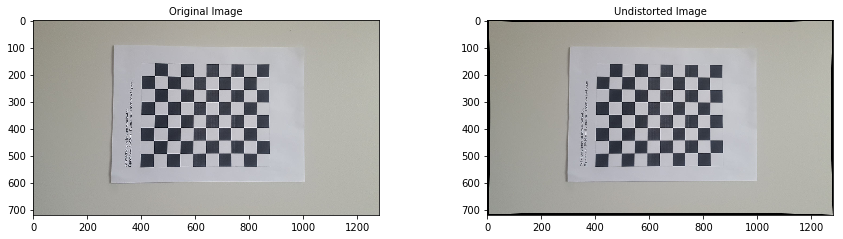

In [10]:
# Load chess test image
chess_frame = plt.imread(chess_images[3])

# Undistort image
undistorted_img = camera.undistort(chess_frame)

# Plot original vs corrected chess image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 3))
f.tight_layout()
ax1.imshow(chess_frame)
ax1.set_title('Original Image', fontsize=10)
ax2.imshow(undistorted_img)
ax2.set_title('Undistorted Image', fontsize=10)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Camera - Calibrate transformation matrix

Here is the second step that should be performed after the camera calibration. Here we define four vertices as source points that should be parallel with the lane lines on the road for the bird eye transformation.

Use the `mask_regions` method in order to adjust the points.

**Important note:** We can clearly observe that my camera was not perfectly aligned with the car front as the left side and right side on my transformation points are not proportional equal. 

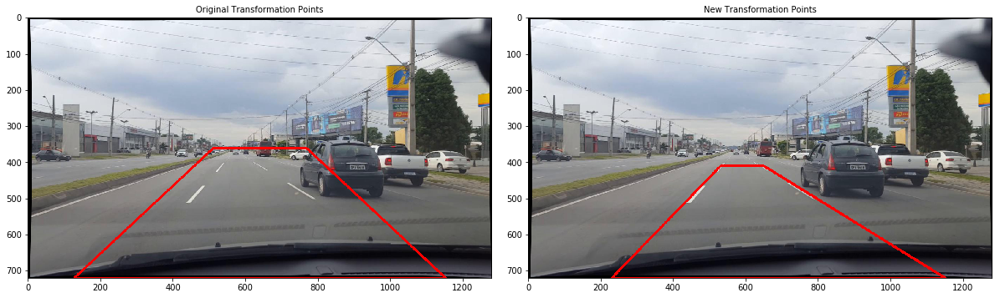

In [11]:
image = plt.imread(test_images[1])

undist = camera.undistort(image)

# Define new source points that will be use to calibrate bird eye view for the camera
src = np.float32([(230, 720), # bottom_left
                  (530, 410), # top_left
                  (650, 410), # top_right
                  (1150, 720)]) # bottom_right

original_mask = camera.mask_regions(undist,camera.src_)
new_mask = camera.mask_regions(undist,src)

# Plot original vs corrected chess image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
f.tight_layout()
ax1.imshow(original_mask)
ax1.set_title('Original Transformation Points', fontsize=10)
ax2.imshow(new_mask)
ax2.set_title('New Transformation Points', fontsize=10)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

camera.calculate_transformation_matrix(src)

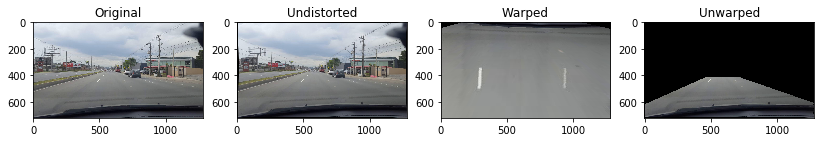

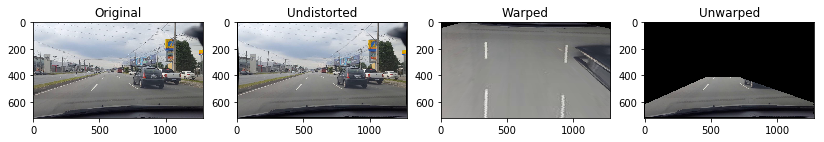

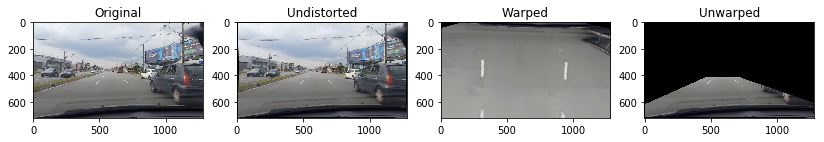

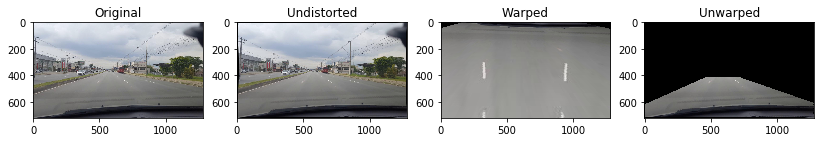

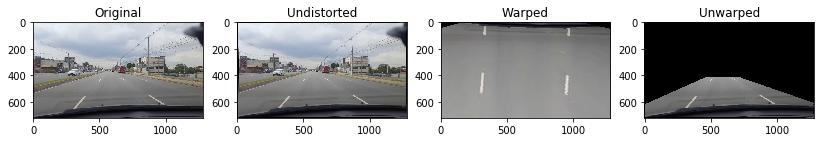

...

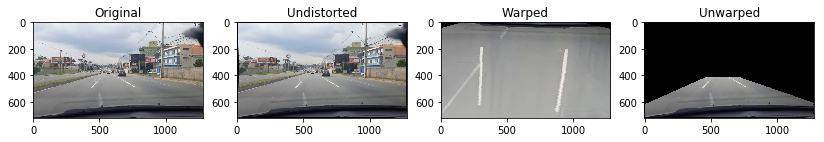

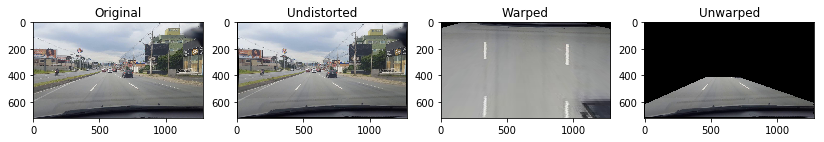

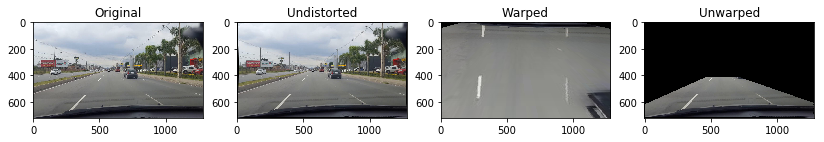

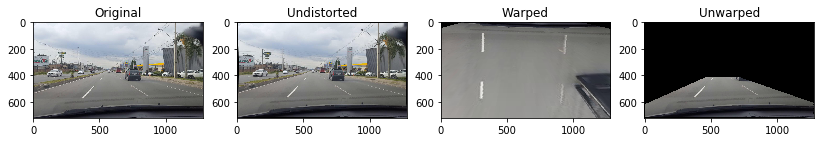

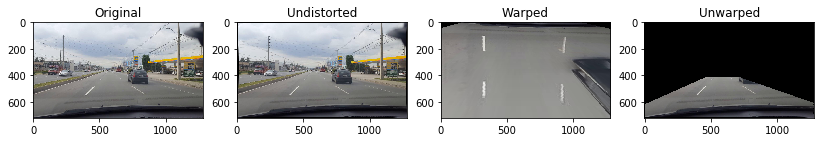

In [12]:
# Let's check the Undistortion, Warp (bird eye) and Unwarped methods after camera calibration and 
# transformation matrix calibration.
for image_path in test_images:
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4)
    
    image = plt.imread(image_path)
    
    f.set_figwidth(14)
    
    ax1.imshow(image)
    ax1.set_title('Original')
    
    undist = camera.undistort(image)
    ax2.imshow(undist)
    ax2.set_title('Undistorted')
    
    warped = camera.warp(undist)
    ax3.imshow(warped)
    ax3.set_title('Warped')
    
    unwarped = camera.unwarp(warped)
    ax4.imshow(unwarped)
    ax4.set_title('Unwarped')
    
    plt.show()


## Lane Filter

On this step we should look to extract just the lanes from our road using some kind of filter on our warped image. There are many possible techniques that we can look including:

* Color filters
* Sobel filters
* Directional filters

## Color Filter

In [13]:
def color_mask(image, lower_range, upper_range, color_space = 'rgb'):
    '''
    This method converts and image from 'BGR' colorspace into another colorspace and creates a binary map just
    preserving the pixels above the lower range and under the upper range.
    
    Arguments:
        image - Color image in BGR format
        
        lower_range - Lower threshold for the binary map. Only the pixels above these values on each channel will be 
        preserved
        
        upper_range - Upper threshold for the binary map. Only the pixels under these values on each channel will be 
        preserved
        
        color_space - The color space that we want to change the default image. Values can be: rgb, hls, hsv, lab, yuv, luv
        
    Return:
    
        Return a binary map made by two values [0,255]
    '''
    if color_space == 'hls':
        image_mask = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
    elif color_space == 'hsv':
        image_mask = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    elif color_space == 'lab':
        image_mask = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    elif color_space == 'yuv':
        image_mask = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)
    elif color_space =='luv':   
        image_mask = cv2.cvtColor(image, cv2.COLOR_BGR2LUV)
    else:
        image_mask = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    binary_output = cv2.inRange(image_mask, lower_range,upper_range)

    return binary_output

def color_mask_test(image, color_space, max_threshold = np.uint8([255, 255, 255])):
    '''
    This method is used to check the best color space and threshold combinations capable of filtering lanes on a road. 
    
    Arguments:
    
        image: color image
        
        color_space: color space that we want to test the image with different thresholds. Values can be: rgb, hls, hsv, lab, yuv, luv
    
        max_threshold: upper threshold to test each channel. Default values: (255,255,255)
    
    '''
    step = 10
    cols = 5
    rows = 250 // (step * cols)

    for i, channel in enumerate(color_space):

        for row in range(rows):

            f, axes = plt.subplots(1, cols)
            f.set_figwidth(15)

            lower_threshold = np.uint8([0, 0, 0])
            for col in range(cols):
                lower_threshold[i] = col * step + row * step * cols + step

                # Just R channel from RGB color space goes from 0 to 255. On other color spaces it goes from 0 to 180
                if color_space != 'rgb' and lower_threshold[0] > 170:
                    i +=1
                    for remove_index in range(col, cols):
                        axes[remove_index].remove()

                    break
                
                mask = color_mask(image, lower_threshold, max_threshold, color_space = color_space)
                axes[col].imshow(mask, cmap='gray')
                axes[col].set_title(channel + " " + np.array2string(lower_threshold))
        
            plt.show()

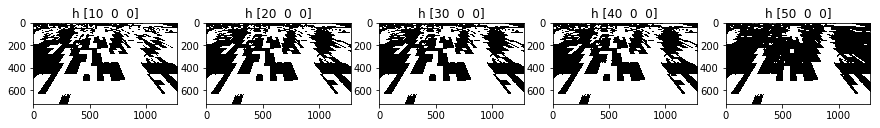

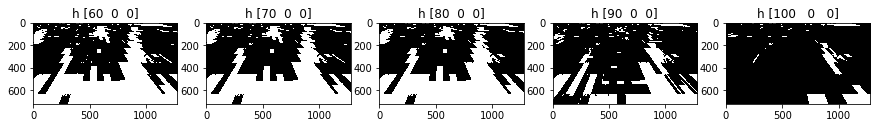

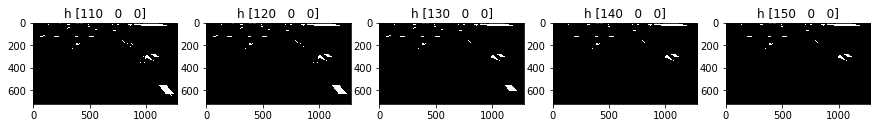

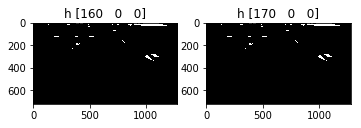

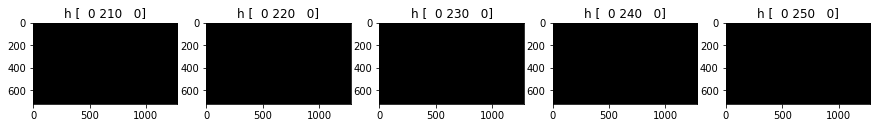

...

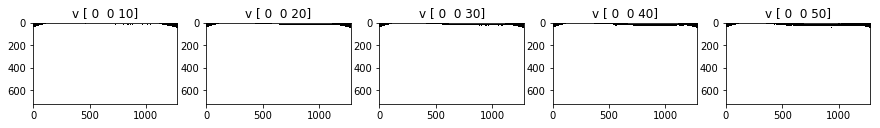

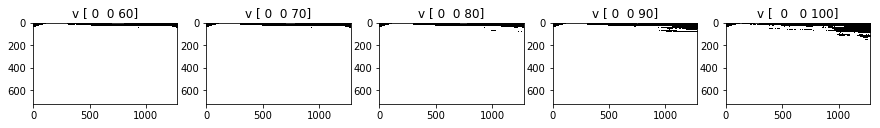

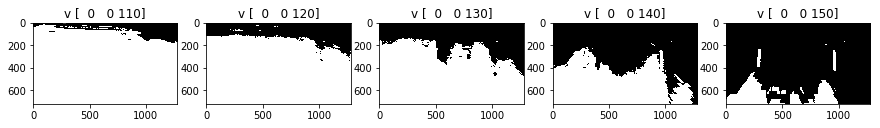

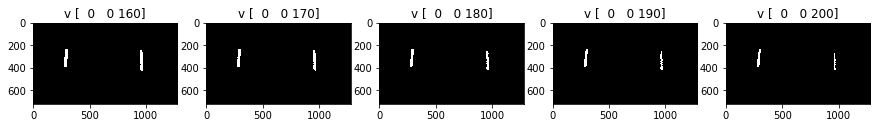

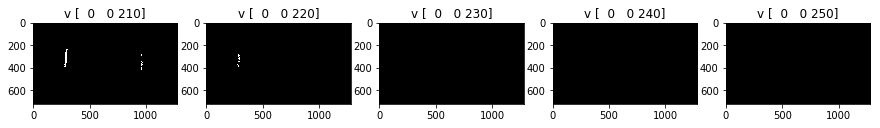

In [14]:
# Load image
image = plt.imread(test_images[10]) 

# Undistort image
undist = camera.undistort(image) 

# Warp (bird eye view) image
warped = camera.warp(undist)    

# Test image for best combination of color space and threshold. On this example we will use just the HSV colorspace but 
# other color spaces can be interesting to test as well.
color_mask_test(warped,'hsv')

## Binary Map

In [15]:
def binary_filter(image):
    '''
    This method creates a binary map from an image. Here we implement the sequence of filters that will be used to
    filter just the road lanes.
    
    Arguments:
        
        image: color image
        
    Return:
    
        This method returns a binary image composed of two values [0,255]
    '''
    # Apply white color filter
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    white_hsv_mask = cv2.inRange(hsv, np.uint8([0,0,190]),np.uint8([255,255,255]))
    
    # Apply threshold filter
    gray =  cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) 
    ret, threshold_mask = cv2.threshold(gray,175,255,cv2.THRESH_BINARY)
    
    # Combine all filters
    binary_output = np.zeros_like(white_hsv_mask)
    binary_output[(white_hsv_mask == 255) | (threshold_mask == 255)]  = 255
    
    return binary_output

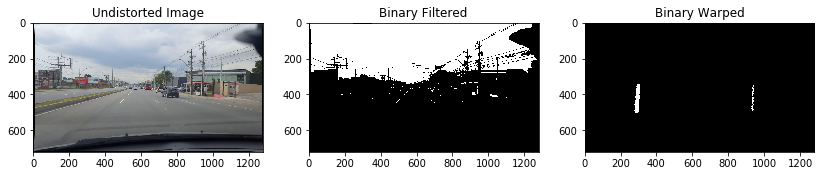

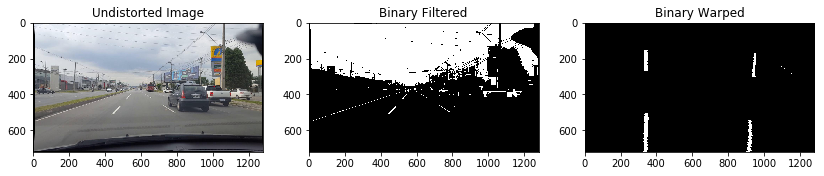

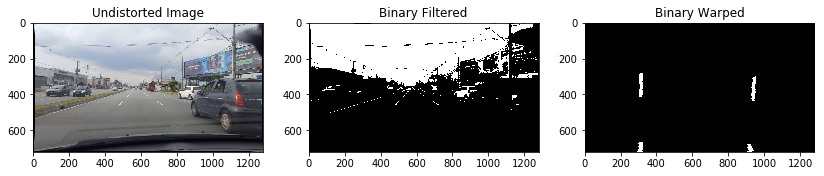

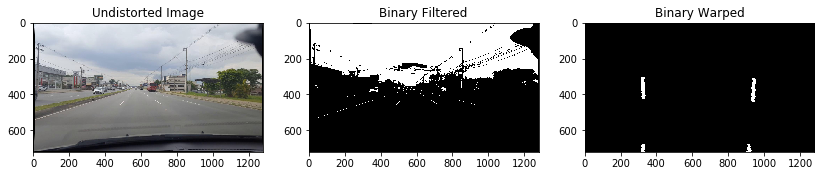

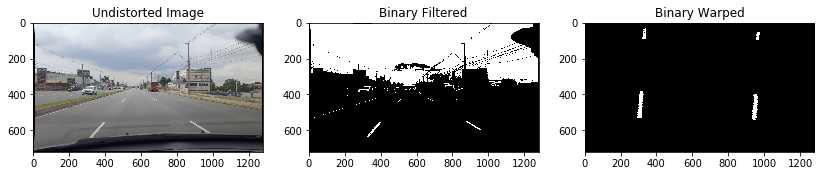

...

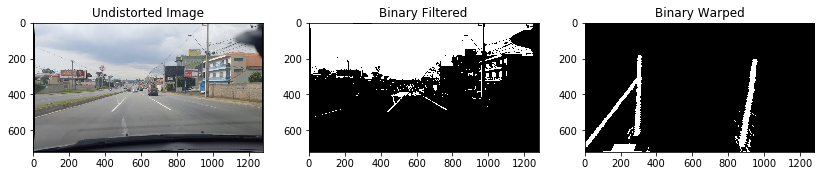

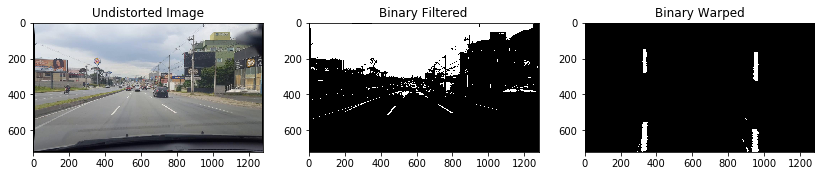

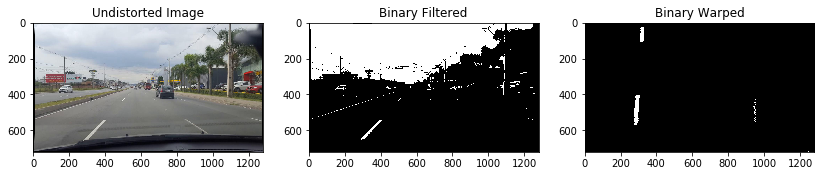

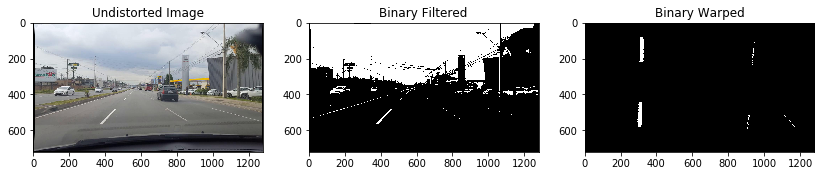

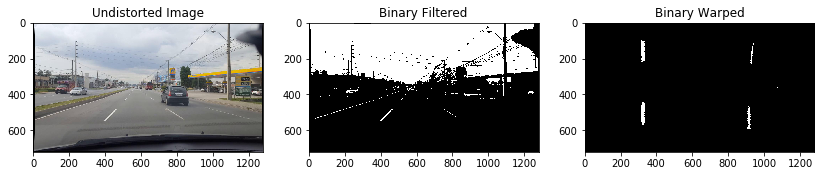

In [16]:
# Test the binary filter on our test samples. 
for image_path in test_images:
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3)
    
    image = plt.imread(image_path)
    undist = camera.undistort(image)
    
    f.set_figwidth(14)
    
    ax1.imshow(undist)
    ax1.set_title('Undistorted Image')
    
    binary_image = binary_filter(undist)
    
    ax2.imshow(binary_image, cmap='gray')
    ax2.set_title('Binary Filtered')
    
    binary_warped = camera.warp(binary_image)
    ax3.imshow(binary_warped, cmap='gray')
    ax3.set_title('Binary Warped')
    
    plt.show()

## Search Lanes Algorithms

Here we will be implementing the following algorithms to find the best polynomial that describes the road lanes:

* Sliding Window
* Search Centroids

In [17]:
def search_lane_peaks(binary_warped, n_windows = 2, margin = 100, plot = False):
    '''
    This method finds the left and right lane centers.
    
    Arguments:
    
        binary_warped - A binary warped image consisting of two values [0,255].
        
        n_windows - Number of horizontal windows splits that will be performed in order to find the histogram peaks.
        
        margin - Left and Right margin from the center starting point on the vertical windows that will be used to find the 
        histogram peaks. At each new iteration this value increases to enlarge the search space. It is used to avoid 
        including non lane parts like cars and other unwanted objects.
        
        plot - If True a histogram plot will be displayed at each iteration. Used just for debugging purposes.
        
    Return
    
        Returns the left and right center lane points on x axis
    
    '''
    # Image dimensions
    width, height = binary_warped.shape[1::-1]
    
    # Set height of windows - based on nwindows above and image shape
    window_height = height // n_windows
    
    left_x_peak = None
    right_x_peak = None
    
    midpoint = np.int(width//2)
    midpoint_left = np.int(midpoint//2)
    midpoint_right = np.int(midpoint//2) + midpoint
    
    # We will start on middle and increase the range space search o vertical axis
    for search_window in range(midpoint_left//margin):
        
        # If we already found lane peaks exit loop
        if left_x_peak is not None and right_x_peak is not None:
            break
        
        # Define left and right search window on vertical axis
        win_xleft_low = midpoint_left - (search_window + 1) * margin
        win_xleft_high = midpoint_left + (search_window + 1) * margin
        win_xright_low = midpoint_right - (search_window + 1) * margin
        win_xright_high = midpoint_right + (search_window + 1) * margin

        for window in range(n_windows):
            
            # If we already found lane peaks exit loop
            if left_x_peak is not None and right_x_peak is not None:
                break
            
            # Get moving window size
            win_y_low  = height - window_height * (window+1)
            win_y_high = height - window_height * window 
            
            # Get left and right histograms peak
            if left_x_peak is None:
            
                l_window = binary_warped[win_y_low:win_y_high,win_xleft_low:win_xleft_high] // 255
                l_histogram = np.sum(l_window, axis=0)
                l_peak = np.argmax(l_histogram) 
                
                if l_peak > 0:
                     left_x_peak = l_peak + win_xleft_low
    
            if right_x_peak is None:
                
                r_window = binary_warped[win_y_low:win_y_high,win_xright_low:win_xright_high] // 255
                r_histogram = np.sum(r_window, axis=0)
                r_peak = np.argmax(r_histogram)
                
                if r_peak> 0:
                    right_x_peak = r_peak + win_xright_low
                    
            if plot:
                
                f, (ax1, ax2) = plt.subplots(1, 2)
                f.set_figwidth(14)
                
                # Plot left histogram with peak
                ax1.imshow(l_window, cmap = 'gray')
                ax1.plot(l_histogram)
                ax1.set_title('Left Histogram', fontsize=10)
                
                # Plot rigth histogram with peak
                ax2.imshow(r_window, cmap = 'gray')
                ax2.plot(r_histogram)
                ax2.set_title('Right Histogram', fontsize=10)
                
                plt.show()
            
    return left_x_peak, right_x_peak

In [18]:
def fit_polynomial(x_axis, y_axis, plot_y):
    '''
    Given a set of points on (x,y) axis finds a second order polynomial equation that best describes this set and return 
    a set of points on y axis using this equation that will be used to plot the lane curvature.
    
    Arguments:
    
        x_axis - Set of points on x axis.
        
        y_axis - Set of points on y axis.
        
        plot_y - A vertical line made by values that will be used by the second order polynomial to plot the lane
        curvature.
        
    Returns:
    
        Curvature points to be used for displaying the lane
        
    '''
    
    # Find a, b, c cefficients from second order polynomial ax^2 + bx + c
    poly_fit = np.polyfit(y_axis, x_axis, 2)
    
    # Fit second order curve on vertical direction
    poly_fitx = poly_fit[0] * plot_y**2 + poly_fit[1] * plot_y + poly_fit[2]
    
    return poly_fitx

In [19]:
def fit_curve(x_axis, plot_y, xm_per_pix = 1, ym_per_pix = 1):
    '''
    This method calculates the lane curvature based on a set or values on (x,y) axis. It alsos convert from pixel metric
    to meters if you specify this ratios on xm_per_pix and ym_per_pix parameters.

    Arguments:
        x_axis - Set of points on x axis.
        
        plot_y - A vertical line made by values that will be used by the second order polynomial to plot the lane
        curvature.
        
        xm_per_pix - Conversion factor from pixels to meters on x axis
        
        ym_per_pix - Conversion factor from pixels to meters on y axis
        
    Return:
        
        Lave curvature
        
    '''
    # If one of the axis is missing we assume an error value
    if x_axis is None or plot_y is None:
        return -99999
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(plot_y)
    
    poly_fit = np.polyfit(plot_y * ym_per_pix, x_axis * xm_per_pix, 2)
    
    curvature = ((1 + (2 * poly_fit[0] * y_eval * ym_per_pix + poly_fit[1]) ** 2)**(1.5)) / np.abs(2 * poly_fit[0])    

    return curvature

In [20]:
def sliding_window(binary_warped, n_windows = 9, margin = 100, min_pixels = 50):
        
    # Image dimensions
    width, height = binary_warped.shape[1::-1]
    
    # Create output image for debugging purposes
    out_img = np.dstack((binary_warped,binary_warped,binary_warped)) 
    
    # Get left and right lane peaks
    left_x_peak, right_x_peak = search_lane_peaks(binary_warped, n_windows = 2)
    
    # Set height of windows - based on nwindows above and image shape
    window_height = height // n_windows
    
    # Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    left_current_x_peak = left_x_peak
    right_current_x_peak = right_x_peak
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    for window in range(n_windows):
        
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        
        if left_x_peak:
        
            win_xleft_low = left_current_x_peak - margin
            win_xleft_high = left_current_x_peak + margin
            
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            
            # Identify the nonzero pixels in x and y within the window #
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                              (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > min_pixels:
                left_current_x_peak = np.int(np.mean(nonzerox[good_left_inds]))
            
        if right_x_peak:
            
            win_xright_low = right_current_x_peak - margin
            win_xright_high = right_current_x_peak + margin
            
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        
            # Identify the nonzero pixels in x and y within the window #
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                               (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    
            # Append these indices to the lists
            right_lane_inds.append(good_right_inds)
        
            # If you found > minpix pixels, recenter next window on their mean position           
            if len(good_right_inds) > min_pixels:        
                right_current_x_peak = np.int(np.mean(nonzerox[good_right_inds]))
    
    # Generate x and y values for plotting
    plot_y = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )  
    left_fitx = None
    right_fitx = None
    
    if left_x_peak:  
        
        left_lane_inds = np.concatenate(left_lane_inds)
        
        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        
        # Fit ax^2 + bx + c curves
        if len(leftx) > 0:   
            left_fitx = fit_polynomial(leftx , lefty, plot_y) 
            
            # Colors in the left and right lane regions
            out_img[lefty, leftx] = [255, 0, 0]

    if right_x_peak:
        
        right_lane_inds = np.concatenate(right_lane_inds)   

        # Extract left and right line pixel positions
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]   
        
        if len(rightx) > 0:
            right_fitx = fit_polynomial(rightx, righty, plot_y)
            
            # Colors in the left and right lane regions    
            out_img[righty, rightx] = [0, 0, 255]
            
    return left_fitx, right_fitx, plot_y, out_img

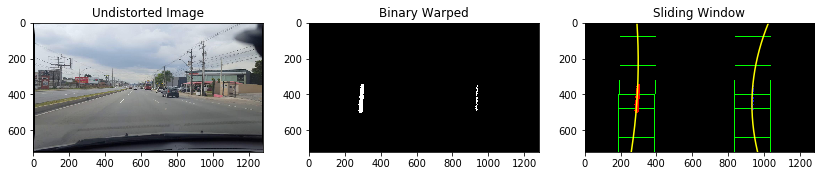

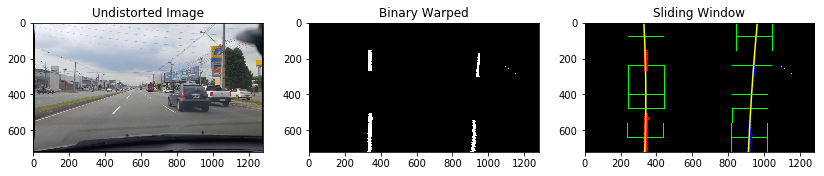

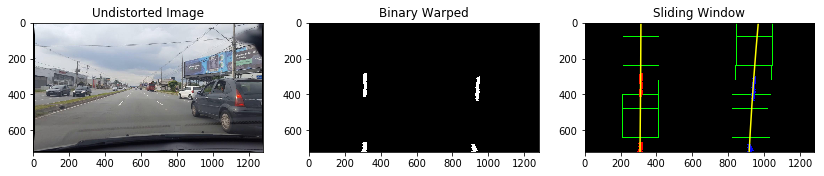

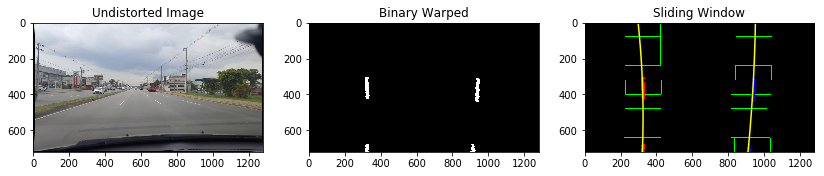

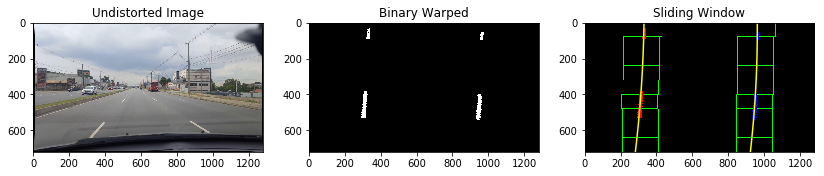

...

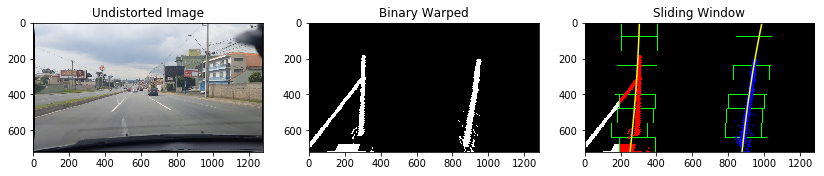

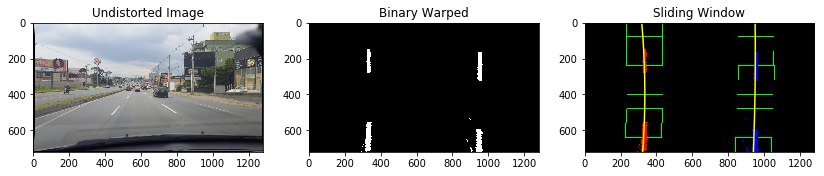

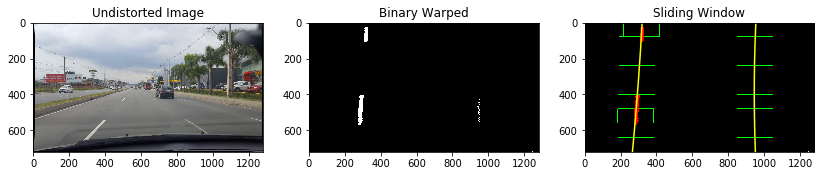

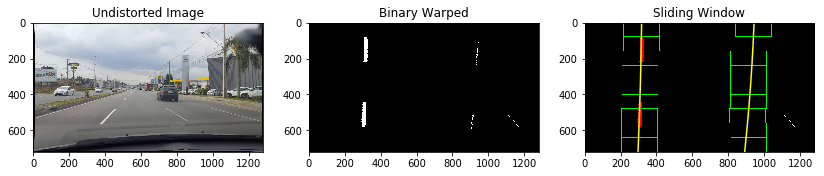

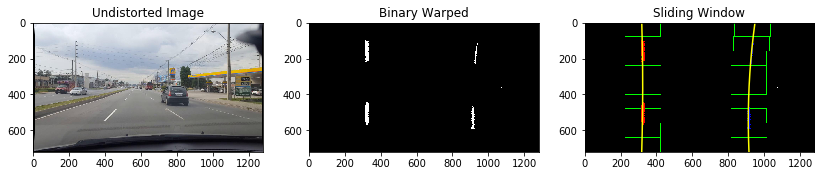

In [21]:
###############################################################################
# Plot images - Sliding Window
###############################################################################
for image_path in test_images:
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3)
    
    image = plt.imread(image_path)
    undist = camera.undistort(image)
    binary_image = binary_filter(undist)
    binary_warped = camera.warp(binary_image)
    
    left_fitx, right_fitx, plot_y, out_img = sliding_window(binary_warped)
    
    f.set_figwidth(14)
    
    ax1.imshow(undist)
    ax1.set_title('Undistorted Image')
    
    ax2.imshow(binary_warped, cmap='gray')
    ax2.set_title('Binary Warped')
    
    ax3.imshow(out_img, cmap='gray')
    ax3.set_title('Sliding Window')
    ax3.plot(left_fitx, plot_y, color='yellow')
    ax3.plot(right_fitx, plot_y, color='yellow')
    
    plt.show()  

In [22]:
def window_mask(width, height, img_ref, center, level):
    
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    
    return output

def search_centroids(binary_warped, window_width = 50 ,window_height = 80, margin = 100):
    
    # Image dimensions
    width, height = binary_warped.shape[1::-1]
    
    # Store the (left,right) window centroid positions per level
    window_centroids = []
    window_kernel = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # Get left and right lane peaks
    l_center, r_center = search_lane_peaks(binary_warped, n_windows = 2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center, r_center))
    
    n_windows = int(height/ window_height)
    
    # Go through each layer looking for max pixel locations
    for window in range(1,n_windows):

        win_y_low  = height - window_height * (window+1)
        win_y_high = height - window_height * window 
        
        # convolve the window into the vertical slice of the image
        image_layer = np.sum(binary_warped[win_y_low : win_y_high,:], axis=0)
        conv_signal = np.convolve(window_kernel, image_layer)
    
        # Find the best left centroid by using past left center as a reference
        # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
        offset = window_width//2
        
        if l_center:
            
            l_min_index = int(max(l_center + offset - margin,0))
            l_max_index = int(min(l_center + offset + margin,width))
            l_signal = conv_signal[l_min_index:l_max_index]
            
            #
            if np.max(l_signal) > 0:
                l_center = np.argmax(l_signal) + l_min_index - offset

        if r_center:
            
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center+offset-margin,0))
            r_max_index = int(min(r_center+offset+margin,width))
            r_signal = conv_signal[r_min_index:r_max_index]
            
            if np.max(r_signal) > 0:
                r_center = np.argmax(r_signal) + r_min_index - offset
  
        # Add what we found for that layer
        window_centroids.append((l_center,r_center))

    y_space = []
    
    # If we found any window centers
    if len(window_centroids) > 0:
        
        # Points used to draw all the left and right windows
        l_points = np.zeros_like(binary_warped)
        r_points = np.zeros_like(binary_warped)
    
        # Go through each level and draw the windows 	
        for level in range(0,len(window_centroids)):
            
            y_space.append(int(height - (level+1)  * window_height))
            
            if l_center:
            
                # Window_mask is a function to draw window areas
                l_mask = window_mask(window_width,window_height,binary_warped,window_centroids[level][0],level)
                
                # Add graphic points from window mask here to total pixels found 
                l_points[(l_points == 255) | ((l_mask == 1))] = 255
                
            if r_center:
                
                # Window_mask is a function to draw window areas
                r_mask = window_mask(window_width,window_height,binary_warped,window_centroids[level][1],level)
   
                # Add graphic points from window mask here to total pixels found 
                r_points[(r_points == 255) | ((r_mask == 1))] = 255
    
        # Draw the results
        template = np.array(r_points + l_points, np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channel
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage= np.dstack((binary_warped, binary_warped, binary_warped)) # making the original road pixels 3 color channels
        out_img = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
     
    # If no window centers found, just display orginal road image
    else:
        out_img = np.array(cv2.merge((binary_warped,binary_warped,binary_warped)),np.uint8)

    # Generate x and y values for plotting
    plot_y = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] ) 
    
    window_centroids = np.array(window_centroids,dtype=float)
    
    # Fit polynomial curve
    left_fitx = None
    right_fitx = None
    
    if l_center:
        left_fitx = fit_polynomial(window_centroids[:,0] , y_space,plot_y)
    
    if r_center:
        right_fitx= fit_polynomial(window_centroids[:,1] , y_space,plot_y)

    return left_fitx, right_fitx, plot_y, out_img

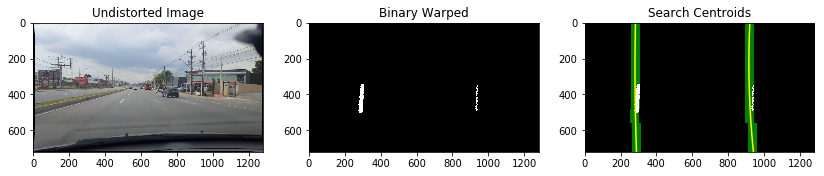

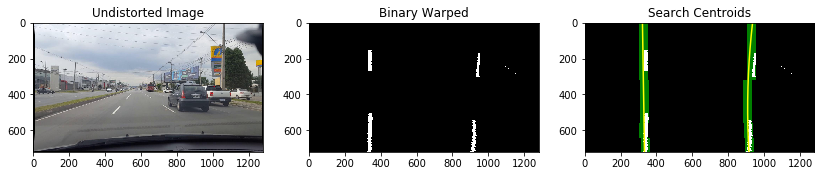

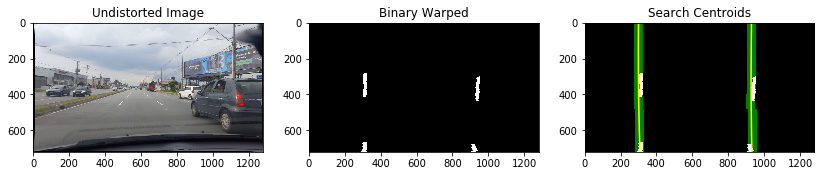

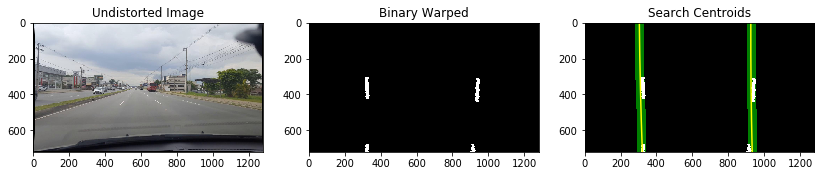

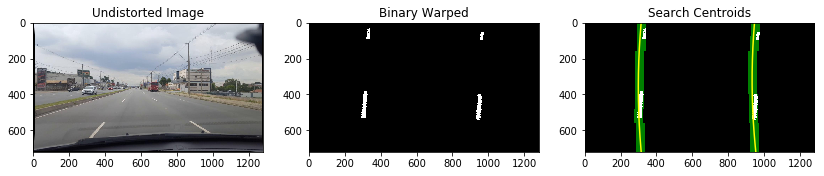

...

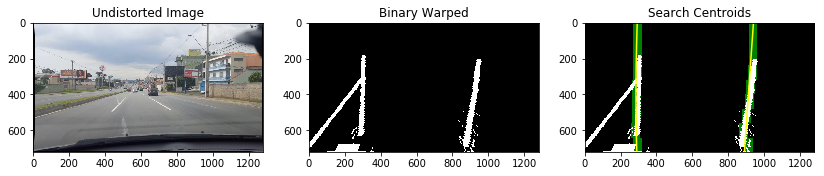

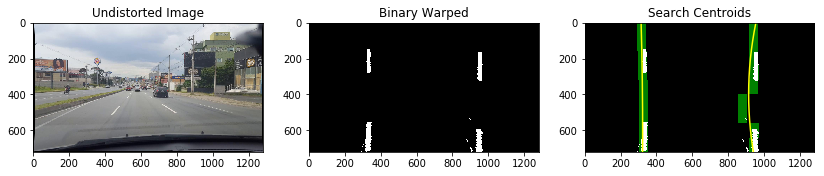

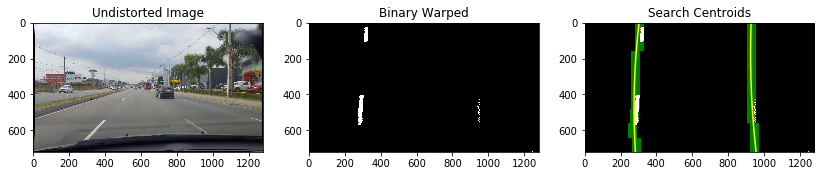

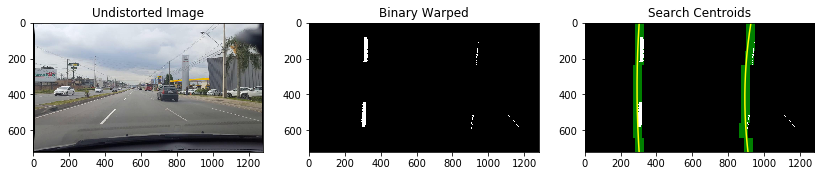

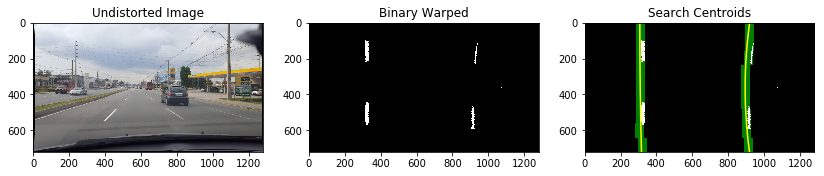

In [23]:
###############################################################################
# Plot images - Search Centroids
###############################################################################
for image_path in test_images:
    
    f, (ax1, ax2, ax3) = plt.subplots(1, 3)
    
    image = plt.imread(image_path)
    undist = camera.undistort(image)
    binary_image = binary_filter(undist)
    binary_warped = camera.warp(binary_image)
    
    left_fitx, right_fitx, plot_y, out_img = search_centroids(binary_warped)
    
    f.set_figwidth(14)
    
    ax1.imshow(undist)
    ax1.set_title('Undistorted Image')
    
    ax2.imshow(binary_warped, cmap='gray')
    ax2.set_title('Binary Warped')

    ax3.imshow(out_img, cmap='gray')
    ax3.set_title('Search Centroids')
    ax3.plot(left_fitx, plot_y, color='yellow')
    ax3.plot(right_fitx, plot_y, color='yellow')
    
    plt.show()  

In [24]:
def print_text(img, text, xy_cord, color=(255, 255, 255)):

    cv2.putText(img, text, xy_cord, cv2.FONT_HERSHEY_SIMPLEX, 1,color , 2)

def draw_lanes(binary_warped, left_fitx, right_fitx, plot_y):
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero)) 
    
    # If we don't have one side or the curves we just return the default color image
    if left_fitx is None or right_fitx is None:
        return color_warp
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, plot_y]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, plot_y])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    return color_warp

In [25]:
def process_frame(image_file, algorithm='window'):
    
    # Read image
    image = plt.imread(image_file)
    
    # Undistort frame
    undist = camera.undistort(image)
    
    # Binary map
    binary_image = binary_filter(undist)
    
    # Binary warped (bird-eye)
    binary_warped = camera.warp(binary_image)
        
    if algorithm == 'window':
        left_fitx, right_fitx, plot_y, out_img = sliding_window(binary_warped)
    else:
        left_fitx, right_fitx, plot_y, out_img = search_centroids(binary_warped)
        
    color_warp = draw_lanes(binary_warped, left_fitx, right_fitx, plot_y)
    
    # Unwarp colored lanes
    unwarped_img = camera.unwarp(color_warp)
    
    # Add colored lane to original image
    result = cv2.addWeighted(undist, 1, unwarped_img, 0.3, 0)
    
    # Update curvature
    lane_width = right_fitx[-1] - left_fitx[-1]
    xm_per_pix = 4.0 / lane_width
    ym_per_pix = 32.0 / image.shape[0]
    
    lane_midpoint = (right_fitx[-1] + left_fitx[-1]) / 2
    image_midpoint = image.shape[1] / 2
    deviation = (image_midpoint - lane_midpoint) * xm_per_pix

    left_curvature = fit_curve(left_fitx, plot_y, xm_per_pix, ym_per_pix)
    right_curvature = fit_curve(right_fitx, plot_y,xm_per_pix, ym_per_pix)
    
    # Display information
    print_text(result,'Deviation from center: {:.2f} m'.format(deviation),(40, 100))
    print_text(result,'Left curvature: {:.2f} m'.format(left_curvature),(40, 160))
    print_text(result,'Right curvature: {:.2f} m'.format(right_curvature),(40, 200))
    
    return result

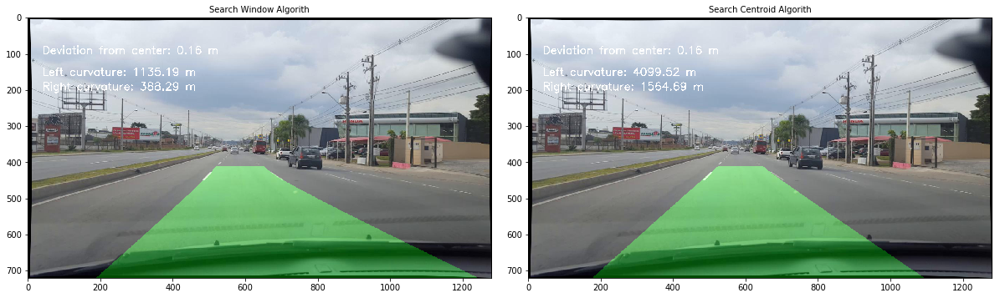

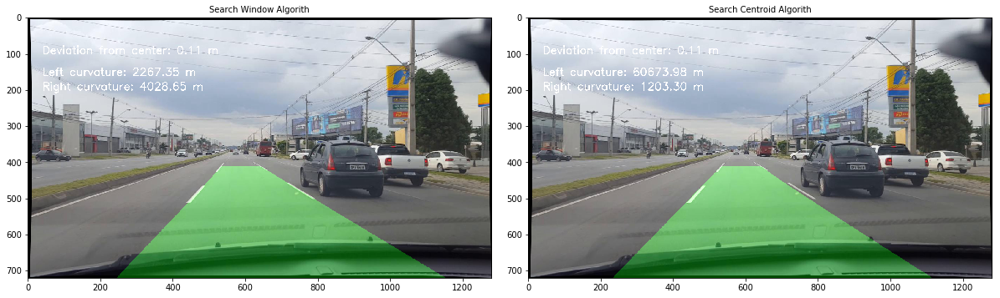

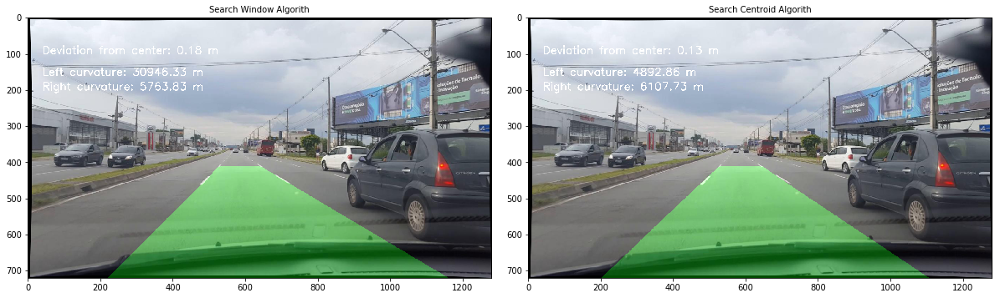

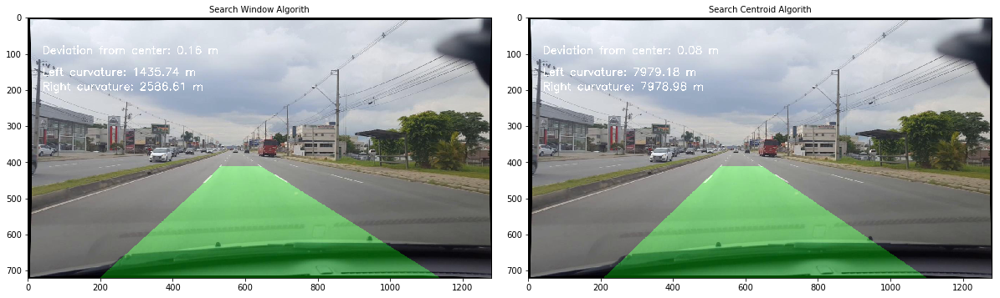

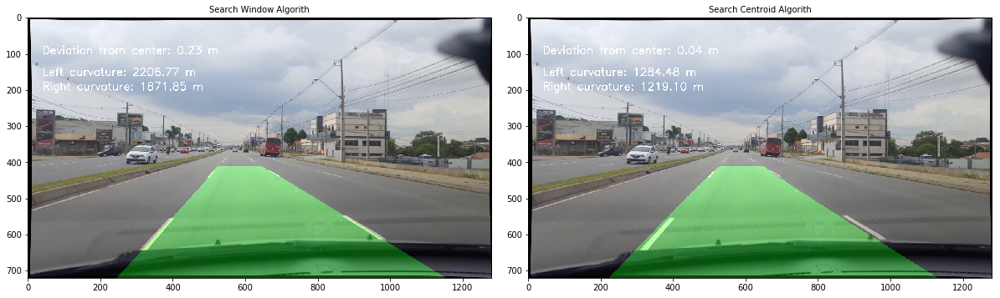

...

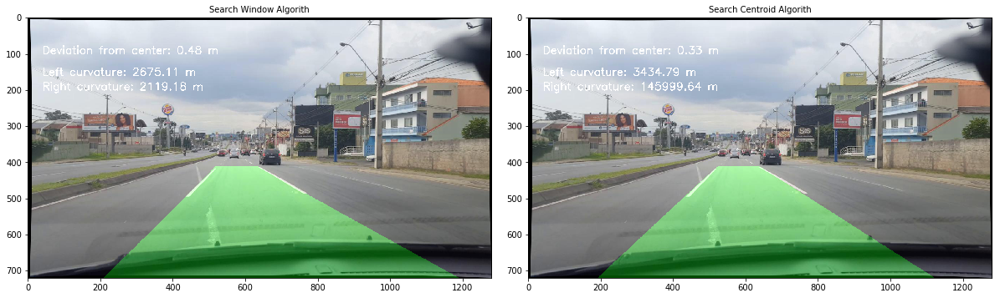

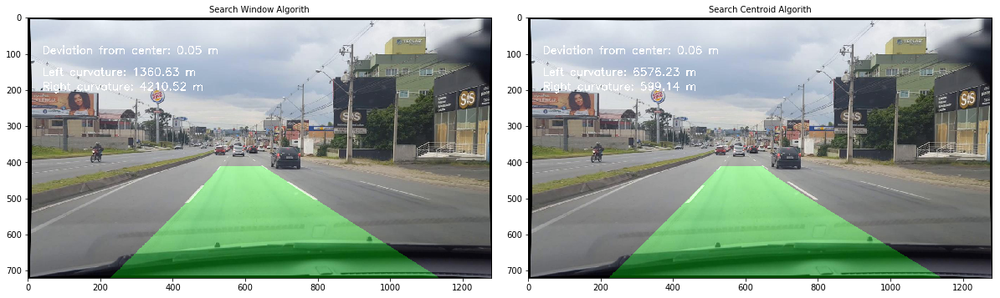

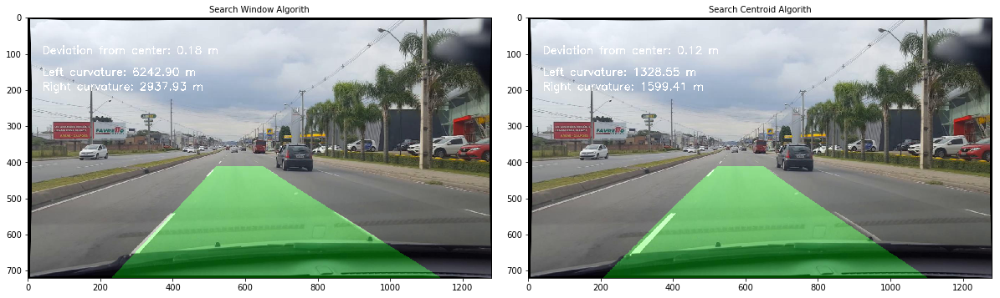

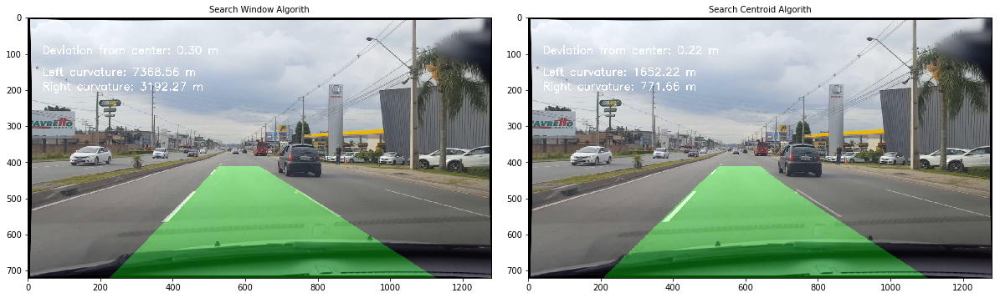

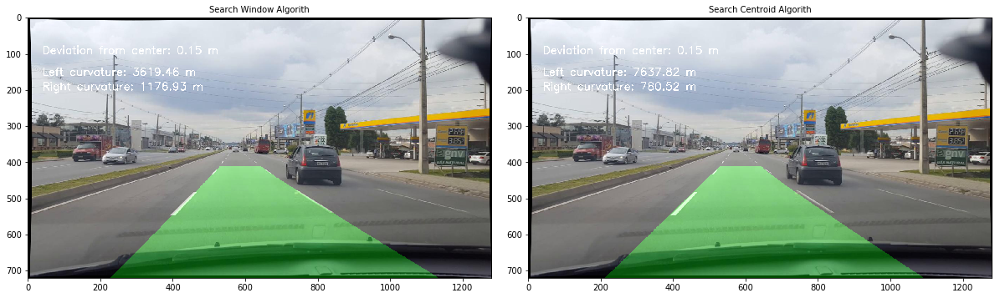

In [26]:
# Test the full pipeline for frame processing using both algorithm: search window and search centroids
for image_path in test_images:
    
     # Plot original vs corrected chess image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
    f.tight_layout()

    # Combine the result with the original image
    result_s = process_frame(image_path,algorithm='window')
    result_c = process_frame(image_path,algorithm='conv')
    
    ax1.imshow(result_s)
    ax1.set_title('Search Window Algorith', fontsize=10)
    
    ax2.imshow(result_c)
    ax2.set_title('Search Centroid Algorith', fontsize=10)
    
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    plt.show()

## Lane Detection Class

One way to improve the lane detection process is to record and monitor the execution of the pipeline, compare with previous steps and decide to keep the present result or discard it. These tasks are better acomplished using classes where we can store the framework execution states.

Below two classes we created: Lane and LaneDetection

The **Lane** class is used to store information about each lane while the **LaneDetection** is used to execute the full framework for lane detection and make decisions based on results.

In [27]:
# Define a class to receive the characteristics of each line detection
class Lane():
    
    def __init__(self):
        
        # was the line detected in the last iteration?
        self.detected = False 

        # x axis
        self.fitx = None
        
        #average x values of the fitted line over the last n iterations
        self.bestx = None  
        
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        
        # failures
        
        self.failures = 0
        self.max_failures = 5
        self.max_threshold = 30
        
        # tracking 
        self.total_count = 0
        self.total_errors = 0
    
        # Number of moving windows
        self.n_windows = 5 
        
    def update(self, fitx):
        
        self.total_count +=1
        
        # Check if lane was detected
        if fitx is None:
            self.detected = False
        else:
            self.fitx = fitx
          
            if self.bestx is None or self.check_parallel(fitx, self.bestx, self.max_threshold):
                
                # Append new line to list on a moving windows
                self.recent_xfitted.append(fitx)
                
                # Update moving window
                if len(self.recent_xfitted) > self.n_windows:
                    self.recent_xfitted = self.recent_xfitted[1:]
                
                # Update best fit
                self.bestx = np.array(self.recent_xfitted).mean(axis=0)
                
                self.detected = True
                self.failures = 0
            else:
                self.detected = False
                self.failures += 1
                
                # If we have too many consecutive failures clear cached lines
                if self.failures > self.max_failures:
                    self.failures = 0
                    self.bestx = fitx 
                    self.recent_xfitted = [] 
     
        if self.detected == False:
            self.total_errors +=1
            
        return self.detected
    
    def check_parallel(self, fitx1, fitx2, max_threshold):
        
        n_points = 3 # Number of points to test
        
        assert len(fitx1) == len(fitx2)
        
        # Check for each equaly distant point if they are not off limits
        for i in np.linspace(0,len(fitx1)-1,n_points).astype(int):
            
            diff = np.abs(fitx1[i] - fitx2[i])
            
            if diff > max_threshold:
                return False
        
        return True
    
    def accuracy(self):
        
        return (self.total_count - self.total_errors) / self.total_count * 100

In [28]:
class LaneDetection():
    
    def __init__(self):
        
        self.left_lane = Lane()
        self.right_lane = Lane()
        self.algorithm = 'window'
    
    def process_frame(self, image):
        
         # Udistort Frame
        undist = camera.undistort(image)
        
        # Create a binary filter
        binary_image = binary_filter(undist)
        
        # Bird Eye view
        binary_warped = camera.warp(binary_image)
        
        if self.algorithm == 'window':
            left_fitx, right_fitx, plot_y, out_img = sliding_window(binary_warped)
        else:
            left_fitx, right_fitx, plot_y, out_img = search_centroids(binary_warped)
    
        if not self.left_lane.update(left_fitx):
            print_text(image, "Left lane not detected", (40, 620))
        if not self.right_lane.update(right_fitx):
            print_text(image, "Right lane not detected", (40, 660))
            
        color_warp = draw_lanes(binary_warped, self.left_lane.bestx, self.right_lane.bestx, plot_y )
            
        # Warp the blank back to original image space using inverse perspective matrix (Minv)
        unwarped_img = camera.unwarp(color_warp)
            
        # Combine the result with the original image
        result = cv2.addWeighted(undist, 1, unwarped_img, 0.3, 0)
        
        # Update curvature
        lane_width = self.right_lane.bestx[-1] - self.left_lane.bestx[-1]
        xm_per_pix = 4.0 / lane_width
        ym_per_pix = 32.0 / image.shape[0]

        lane_midpoint = (self.right_lane.bestx[-1] + self.left_lane.bestx[-1]) / 2
        image_midpoint = image.shape[1] / 2
        deviation = (image_midpoint - lane_midpoint) * xm_per_pix

        left_curvature = fit_curve(self.left_lane.bestx, plot_y, xm_per_pix, ym_per_pix)
        right_curvature = fit_curve(self.right_lane.bestx, plot_y,xm_per_pix, ym_per_pix)

        # Display information
        print_text(result,'Deviation from center: {:.2f} m'.format(deviation),(40, 100))
        print_text(result,'Left curvature: {:.2f} m'.format(left_curvature),(40, 160))
        print_text(result,'Right curvature: {:.2f} m'.format(right_curvature),(40, 200))
    
        print_text(result, "Left detection accuracy: {:.2f} %".format(self.left_lane.accuracy()), (40, 620))
        print_text(result, "Right detection accuracy: {:.2f} % ".format(self.right_lane.accuracy()), (40, 660))
        
        return result

In [29]:
lane_detection = LaneDetection()
lane_detection.algorithm = 'conv'
lane_detection.left_lane.max_threshold = 40

In [30]:
# Define output video
output_video_1 = 'videos/output_video_1.mp4'

# Load clip
clip = VideoFileClip(os.path.join(video_folder,"20190212_181549.mp4"))

# Process images using detect lane class
white_clip = clip.fl_image(lane_detection.process_frame) #NOTE: this function expects color images!!

# Save processed video clip
white_clip.write_videofile(output_video_1,audio=False)

[MoviePy] >>>> Building video videos/output_video_1.mp4
[MoviePy] Writing video videos/output_video_1.mp4


100%|██████████████████████████████████████████████████████████████████████████████| 1318/1318 [03:01<00:00,  6.52it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: videos/output_video_1.mp4 



In [36]:
display(HTML("""
<video width="960" height="540" controls>
  <source src="{0}" type="video/mp4">
</video>
""".format(output_video_1)))

##  Next steps

* Process a more challenging video (20190212_183159.mp4).
* Implement other lane detection algorithms.
* Check for a deep learning aproach.
* Improve footage quality.